In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
### install detectron2 and dependency 

!pip install pyyaml==5.1
# This is the current pytorch version on Colab. Uncomment this if Colab changes its pytorch version
# !pip install torch==1.9.0+cu111 torchvision==0.10.0+cu111 -f https://download.pytorch.org/whl/torch_stable.html

# Install detectron2 that matches the above pytorch version
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu111/torch1.9/index.html
# exit(0)  # After installation, you need to "restart runtime" in Colab. This line can also restart runtime

     |████████████████████████████████| 75.9 MB 5.8 kB/s 
     |████████████████████████████████| 60.7 MB 69 kB/s 
     |████████████████████████████████| 274 kB 7.0 MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44092 sha256=e4268fc3ea1659b9a97df4a4e7e017e23e6585cff87d4ea7e963cc5ddda80eef
  Stored in directory: /root/.cache/pip/wheels/77/f5/10/d00a2bd30928b972790053b5de0c703ca87324f3fead0f2fd9
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |███████████████████████         | 834.1 MB 1.2 MB/s eta 0:04:37tcmalloc: large alloc 1147494400 bytes == 0x561506aae000 @  0x7f54ee156615 0x5615047654cc 0x56150484547a 0x5615047682ed 0x561504859e1d 0x5615047dbe99 0x5615047d69ee 0x561504769bda 0x5615047dbd00 0x5615047d69ee 0x561504769bda 0x5615047d8737 0x5615048

In [ ]:
# check pytorch installation: 
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
assert torch.__version__.startswith("1.9")   # please manually install torch 1.9 if Colab changes its default version

1.7.1+cu110 True
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2020 NVIDIA Corporation
Built on Mon_Oct_12_20:09:46_PDT_2020
Cuda compilation tools, release 11.1, V11.1.105
Build cuda_11.1.TC455_06.29190527_0
Thu Oct 14 14:32:13 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.74       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|=========================

In [ ]:
# Some basic imports:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# tensorboard?
#%load_ext tensorboard
#%tensorboard --logdir output

# necessary libraries
import pandas as pd
import numpy as np
import cv2
import random
import matplotlib.pyplot as plt
from PIL import Image
import os
import numpy as np
import json

#from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.structures import BoxMode

<IPython.core.display.Javascript object>

In [ ]:
### The following two cells just determine that the setup is working correctly on a standard example.

# Get image, hash wget line if already downloaded.
# Just unhash if running this code for the first time, i.e. input.jpg has not yet been downloaded

!wget http://images.cocodataset.org/val2017/000000439715.jpg -O input.jpg
im = cv2.imread("./input.jpg")

# Create config
cfg = get_cfg()

cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml"))

#cfg.merge_file = 'https://github.com/facebookresearch/detectron2/blob/master/configs/COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml'
#cfg.merge_from_file("./detectron2/configs/COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml")

cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model

# Here we just get the pre-trained weights straight from facebook hosting website

cfg.MODEL.WEIGHTS = 'https://dl.fbaipublicfiles.com/detectron2/COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x/138205316/model_final_a3ec72.pkl'



# Create predictor
predictor = DefaultPredictor(cfg)

# Make prediction
outputs = predictor(im)

--2021-10-14 14:32:27--  http://images.cocodataset.org/val2017/000000439715.jpg
Resolving images.cocodataset.org (images.cocodataset.org)... 52.217.134.65
Connecting to images.cocodataset.org (images.cocodataset.org)|52.217.134.65|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 209222 (204K) [image/jpeg]
Saving to: ‘input.jpg’

input.jpg           100%[===================>] 204.32K  1.02MB/s    in 0.2s    

2021-10-14 14:32:27 (1.02 MB/s) - ‘input.jpg’ saved [209222/209222]



model_final_a3ec72.pkl: 254MB [00:03, 64.9MB/s]                           
The checkpoint state_dict contains keys that are not used by the model:
  proposal_generator.anchor_generator.cell_anchors.{0, 1, 2, 3, 4}
/usr/local/lib/python3.7/dist-packages/detectron2/modeling/roi_heads/fast_rcnn.py:154: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:882.)
  filter_inds = filter_mask.nonzero()


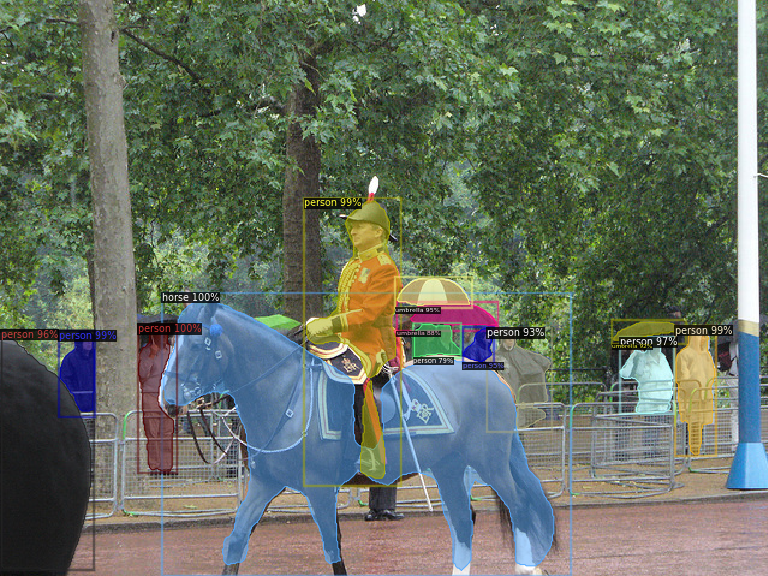

In [ ]:
# Let's have a look
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))

image = cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB)
display(Image.fromarray(image))

In [ ]:
# Make sure the inevitable error messages are useful.
CUDA_LAUNCH_BLOCKING="1"

In [ ]:
#### this loop builds the training dataset

def get_tree_dicts(directory):
    classes = ['tree']
    dataset_dicts = []
    for filename in [file for file in os.listdir(directory) if file.endswith('.geojson')]:
        json_file = os.path.join(directory, filename)
        with open(json_file) as f:
            img_anns = json.load(f)
        
        
        
        record = {}
        
        filename = os.path.join(directory, img_anns["imagePath"])
        # Make sure we have the correct height and width
        height, width = cv2.imread(filename).shape[:2]

        record["file_name"] = filename
        record["height"] = height
        record["width"] = width
        record["image_id"] = filename[0:400]
        print(filename[0:400])
            
        

        objs = []
        for features in img_anns['features']:
            anno = features['geometry']
            # print("##### HERE IS AN ANNO #####", anno)...weirdly sometimes (but not always) have to make 1000 into a np.array
            px = [a[0] for a in anno['coordinates'][0]]
            py = [np.array(height) - a[1] for a in anno['coordinates'][0]]
            # print("### HERE IS PY ###", py)
            poly = [(x, y) for x, y in zip(px, py)]
            poly = [p for x in poly for p in x]
            # print("#### HERE ARE SOME POLYS #####", poly)
            obj = {
                   "bbox": [np.min(px), np.min(py), np.max(px), np.max(py)],
                   "bbox_mode": BoxMode.XYXY_ABS,
                   "segmentation": [poly],
                   "category_id": 0,
                   "iscrowd": 0
                   }
            objs.append(obj)
            # print("#### HERE IS OBJS #####", objs)
        record["annotations"] = objs
        dataset_dicts.append(record)
    return dataset_dicts

from detectron2.data import DatasetCatalog, MetadataCatalog
for d in ["train", "test"]:
    DatasetCatalog.register("trees_" + d, lambda d=d: get_tree_dicts('/content/drive/Shareddrives/detectreeRGB/final_train_test_data/' + d))
    MetadataCatalog.get("trees_" + d).set(thing_classes=['tree'])
trees_metadata = MetadataCatalog.get("trees_train")

/content/drive/Shareddrives/detectreegb/final_train_test_data/train/202105_5cm_tile_286920_583980.png
/content/drive/Shareddrives/detectreegb/final_train_test_data/train/202105_5cm_tile_286755_583730.png
/content/drive/Shareddrives/detectreegb/final_train_test_data/train/202104_5cm_tile_286920_583980.png
/content/drive/Shareddrives/detectreegb/final_train_test_data/train/202105_5cm_tile_286555_583760.png
/content/drive/Shareddrives/detectreegb/final_train_test_data/train/202104_5cm_tile_286755_583730.png
/content/drive/Shareddrives/detectreegb/final_train_test_data/train/202105_5cm_tile_286740_583840.png
/content/drive/Shareddrives/detectreegb/final_train_test_data/train/2019_10cm_tile_287295_584040.png
/content/drive/Shareddrives/detectreegb/final_train_test_data/train/202104_5cm_tile_286740_583840.png
/content/drive/Shareddrives/detectreegb/final_train_test_data/train/202104_5cm_tile_286555_583760.png
/content/drive/Shareddrives/detectreegb/final_train_test_data/train/2019_10cm_tile_

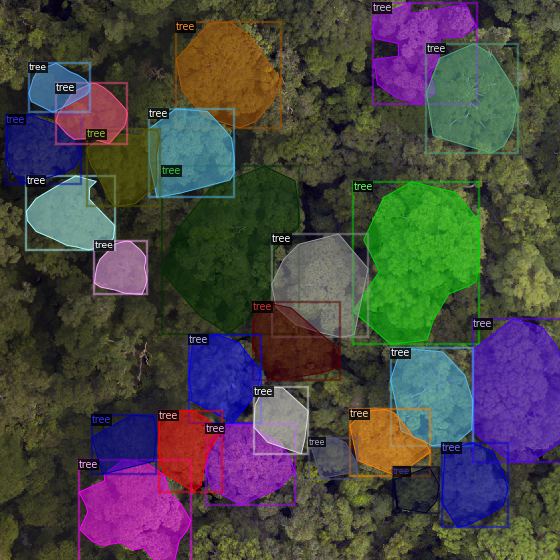

In [ ]:
# Let's look at our training image and annos for our geojson sepilok dataset!!!

dataset_dicts = get_tree_dicts("/content/drive/Shareddrives/detectreeRGB/final_train_test_data/train")
for d in random.sample(dataset_dicts, 1):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=trees_metadata, scale=0.4)
    out = visualizer.draw_dataset_dict(d)
    image = cv2.cvtColor(out.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB)
    #display(Image.fromarray(img))
    display(Image.fromarray(image))

In [ ]:
### Setup the evaluator

from detectron2.evaluation import (
    CityscapesInstanceEvaluator,
    CityscapesSemSegEvaluator,
    COCOEvaluator,
    COCOPanopticEvaluator,
    DatasetEvaluators,
    LVISEvaluator,
    PascalVOCDetectionEvaluator,
    SemSegEvaluator,
    verify_results,
)

from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader


In [ ]:
from detectron2.engine.hooks import HookBase
from detectron2.evaluation import inference_context
from detectron2.utils.logger import log_every_n_seconds
from detectron2.data import DatasetMapper, build_detection_test_loader, build_detection_train_loader
import detectron2.utils.comm as comm
#import torch
import time
import datetime

class LossEvalHook(HookBase):
    def __init__(self, eval_period, model, data_loader):
        self._model = model
        self._period = eval_period
        self._data_loader = data_loader
    
    def _do_loss_eval(self):
        # Copying inference_on_dataset from evaluator.py
        total = len(self._data_loader)
        num_warmup = min(5, total - 1)
            
        start_time = time.perf_counter()
        total_compute_time = 0
        losses = []
        for idx, inputs in enumerate(self._data_loader):            
            if idx == num_warmup:
                start_time = time.perf_counter()
                total_compute_time = 0
            start_compute_time = time.perf_counter()
            if torch.cuda.is_available():
                torch.cuda.synchronize()
            total_compute_time += time.perf_counter() - start_compute_time
            iters_after_start = idx + 1 - num_warmup * int(idx >= num_warmup)
            seconds_per_img = total_compute_time / iters_after_start
            if idx >= num_warmup * 2 or seconds_per_img > 5:
                total_seconds_per_img = (time.perf_counter() - start_time) / iters_after_start
                eta = datetime.timedelta(seconds=int(total_seconds_per_img * (total - idx - 1)))
                log_every_n_seconds(
                    logging.INFO,
                    "Loss on Validation  done {}/{}. {:.4f} s / img. ETA={}".format(
                        idx + 1, total, seconds_per_img, str(eta)
                    ),
                    n=5,
                )
            loss_batch = self._get_loss(inputs)
            losses.append(loss_batch)
        mean_loss = np.mean(losses)
        self.trainer.storage.put_scalar('validation_loss', mean_loss)
        comm.synchronize()

        return losses
            
    def _get_loss(self, data):
        # How loss is calculated on train_loop 
        metrics_dict = self._model(data)
        metrics_dict = {
            k: v.detach().cpu().item() if isinstance(v, torch.Tensor) else float(v)
            for k, v in metrics_dict.items()
        }
        total_losses_reduced = sum(loss for loss in metrics_dict.values())
        return total_losses_reduced
        
        
    def after_step(self):
        next_iter = self.trainer.iter + 1
        is_final = next_iter == self.trainer.max_iter
        if is_final or (self._period > 0 and next_iter % self._period == 0):
            self._do_loss_eval()
        self.trainer.storage.put_scalars(timetest=12)

In [ ]:
# just setting up the cfg file...these treaining parameters don't matter in this cell as they are overwritten below

from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("trees_train",)
cfg.DATASETS.TEST = ("trees_test",)
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 900
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1

In [ ]:
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator
import detectron2.data.transforms as T
from detectron2.data import detection_utils as utils

class MyTrainer(DefaultTrainer):
    @classmethod
    def build_evaluator(cls, cfg, dataset_name, output_folder=None):
        if output_folder is None:
            os.makedirs("eval_2", exist_ok=True)
            output_folder = "eval_2"
        return COCOEvaluator(dataset_name, cfg, True, output_folder)
                     
    def build_hooks(self):
        hooks = super().build_hooks()
        hooks.insert(-1,LossEvalHook(
            cfg.TEST.EVAL_PERIOD,
            self.model,
            build_detection_test_loader(
                self.cfg,
                self.cfg.DATASETS.TEST[0],
                DatasetMapper(self.cfg,True)
            )
        ))
        return hooks

    def build_train_loader(cls, cfg):
        return build_detection_train_loader(cfg, mapper=DatasetMapper(cfg, is_train=True, augmentations=[T.Resize((800, 800)), T.RandomBrightness(0.8, 1.8), 
        T.RandomContrast(0.6, 1.3), T.RandomSaturation(0.8, 1.4), T.RandomRotation(angle=[90, 90], expand=False), T.RandomLighting(0.7),
        T.RandomFlip(prob=0.4, horizontal=False, vertical=True)]))

In [ ]:
# Train! Can change hyperparameters e.g. learning rate

import logging

from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("trees_train",)
cfg.DATASETS.TEST = ("trees_test",)
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml")

# load our pre-trained model if you like
#cfg.MODEL.WEIGHTS = '/content/drive/Shareddrives/detectreeRGB/weights/model_final.pth'

cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.0003
cfg.SOLVER.MAX_ITER = 1000
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1

### From here is the important bit that hasn't been repeated further up
#cfg.TEST.EVAL_PERIOD = 100

# make clear where the output file each time

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = MyTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()
#eval_results = inference_on_dataset(trainer.model, val_loader, DatasetEvaluators(evaluator))


#trainer.test(cfg, trainer.model, evaluator)



[10/14 15:35:58 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to incompatible shapes: (80, 256, 1, 1) in the checkpoint but (1, 256, 1, 1) in

[10/14 15:36:04 d2.engine.train_loop]: Starting training from iteration 0
[10/14 15:36:14 d2.utils.events]:  eta: 0:07:25  iter: 19  total_loss: 4.2  loss_cls: 0.7212  loss_box_reg: 0.6751  loss_mask: 0.6942  loss_rpn_cls: 1.919  loss_rpn_loc: 0.2355  time: 0.4546  data_time: 0.0282  lr: 5.9943e-06  max_mem: 5708M
[10/14 15:36:23 d2.utils.events]:  eta: 0:07:20  iter: 39  total_loss: 2.651  loss_cls: 0.6463  loss_box_reg: 0.7195  loss_mask: 0.6897  loss_rpn_cls: 0.3876  loss_rpn_loc: 0.1858  time: 0.4582  data_time: 0.0049  lr: 1.1988e-05  max_mem: 5708M
[10/14 15:36:32 d2.utils.events]:  eta: 0:07:10  iter: 59  total_loss: 2.33  loss_cls: 0.5959  loss_box_reg: 0.7123  loss_mask: 0.6797  loss_rpn_cls: 0.2011  loss_rpn_loc: 0.164  time: 0.4592  data_time: 0.0044  lr: 1.7982e-05  max_mem: 5708M
[10/14 15:36:42 d2.utils.events]:  eta: 0:07:05  iter: 79  total_loss: 2.315  loss_cls: 0.5639  loss_box_reg: 0.7072  loss_mask: 0.6634  loss_rpn_cls: 0.2277  loss_rpn_loc: 0.174  time: 0.4610  da

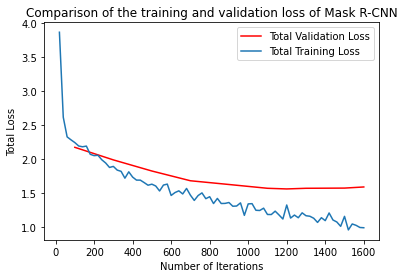

In [ ]:
### Plot training and validation loss on the same plot to check how the training has gone

import json
import matplotlib.pyplot as plt

experiment_folder = '/content/output'

def load_json_arr(json_path):
    lines = []
    with open(json_path, 'r') as f:
        for line in f:
            lines.append(json.loads(line))
    return lines

experiment_metrics = load_json_arr(experiment_folder + '/metrics.json')

plt.plot(
    [x['iteration'] for x in experiment_metrics if 'validation_loss' in x], 
    [x['validation_loss'] for x in experiment_metrics if 'validation_loss' in x], label='Total Validation Loss', color='red')
plt.plot(
    [x['iteration'] for x in experiment_metrics if 'total_loss' in x], 
    [x['total_loss'] for x in experiment_metrics if 'total_loss' in x], label='Total Training Loss')

plt.legend(loc='upper right')
plt.title('Comparison of the training and validation loss of Mask R-CNN')
plt.ylabel('Total Loss')
plt.xlabel('Number of Iterations')
plt.show()

In [ ]:
# Setup to predict on new images, here setting up for the trees_test dataset, but can also use this setup
# for predicting on individual images as seen 2 cells down

from detectron2.utils.visualizer import ColorMode

# Weights automatically saved to OUTPUT_DIR + model_final.pth following training
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")

# threshold confidence for predicted trees
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.15
cfg.DATASETS.TEST = ("trees_test",)
predictor = DefaultPredictor(cfg)

/content/drive/Shareddrives/detectreegb/final_train_test_data/test/tile_602900_646900.png
/content/drive/Shareddrives/detectreegb/final_train_test_data/test/202105_5cm_tile_287185_584065.png
/content/drive/Shareddrives/detectreegb/final_train_test_data/test/202104_5cm_tile_287185_584065.png
/content/drive/Shareddrives/detectreegb/final_train_test_data/test/2019_10cm_tile_287185_584065.png
/content/drive/Shareddrives/detectreegb/final_train_test_data/test/2016_10cm_tile_287185_584065.png
/content/drive/Shareddrives/detectreegb/final_train_test_data/test/tile_603200_647700.png
/content/drive/Shareddrives/detectreegb/final_train_test_data/test/tile_603200_647600.png
/content/drive/Shareddrives/detectreegb/final_train_test_data/test/tile_603200_647300.png
/content/drive/Shareddrives/detectreegb/final_train_test_data/test/tile_603200_647400.png
/content/drive/Shareddrives/detectreegb/final_train_test_data/test/tile_603200_647200.png
/content/drive/Shareddrives/detectreegb/final_train_test_d

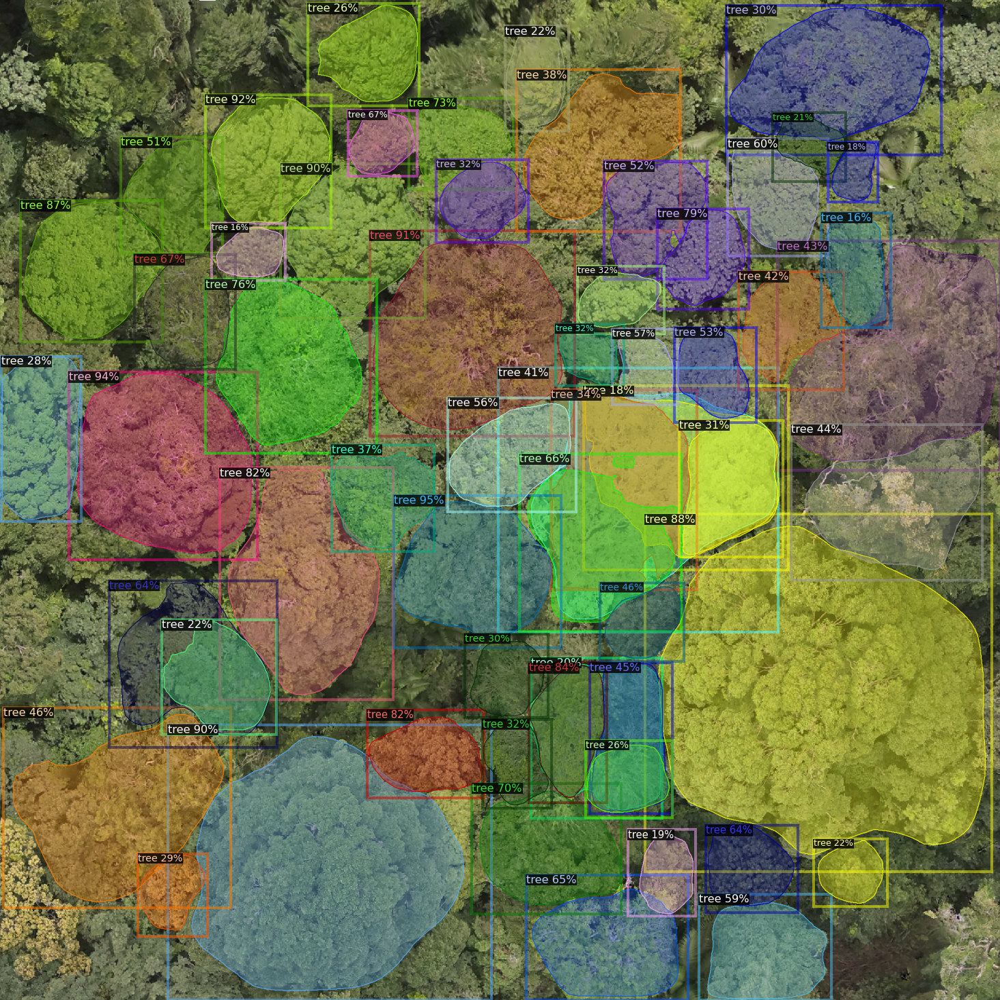

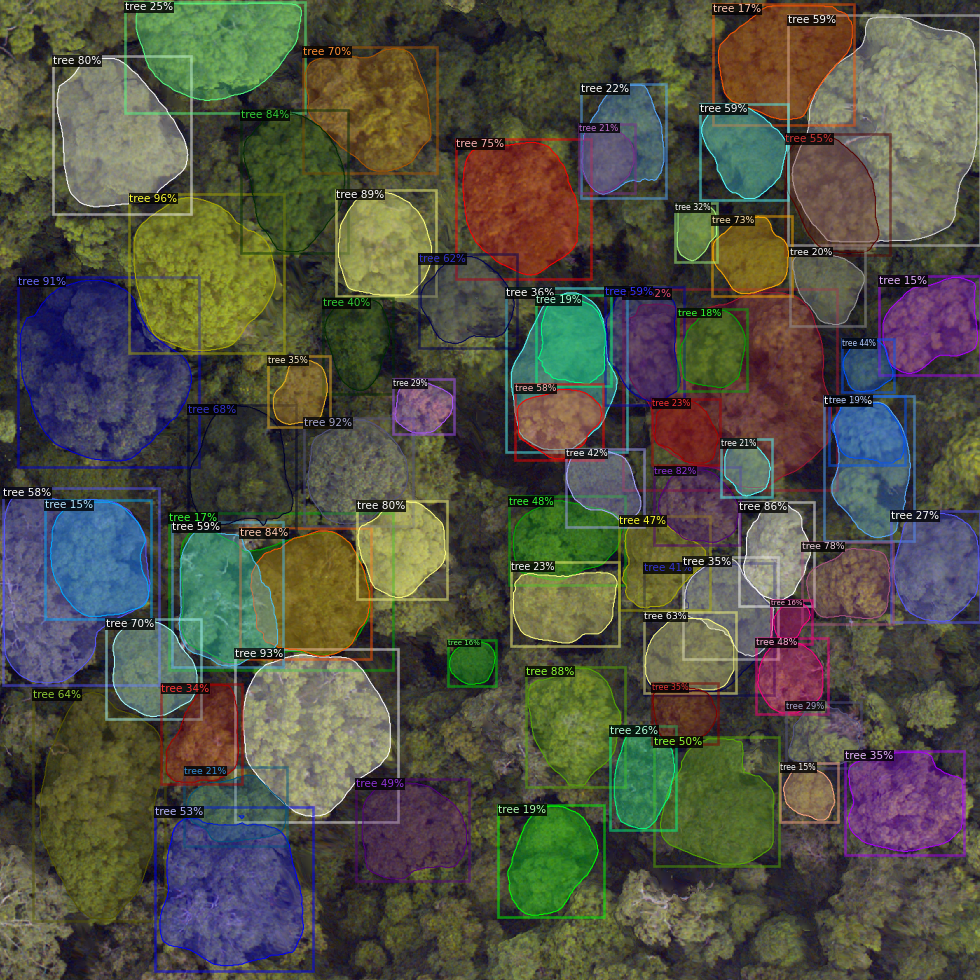

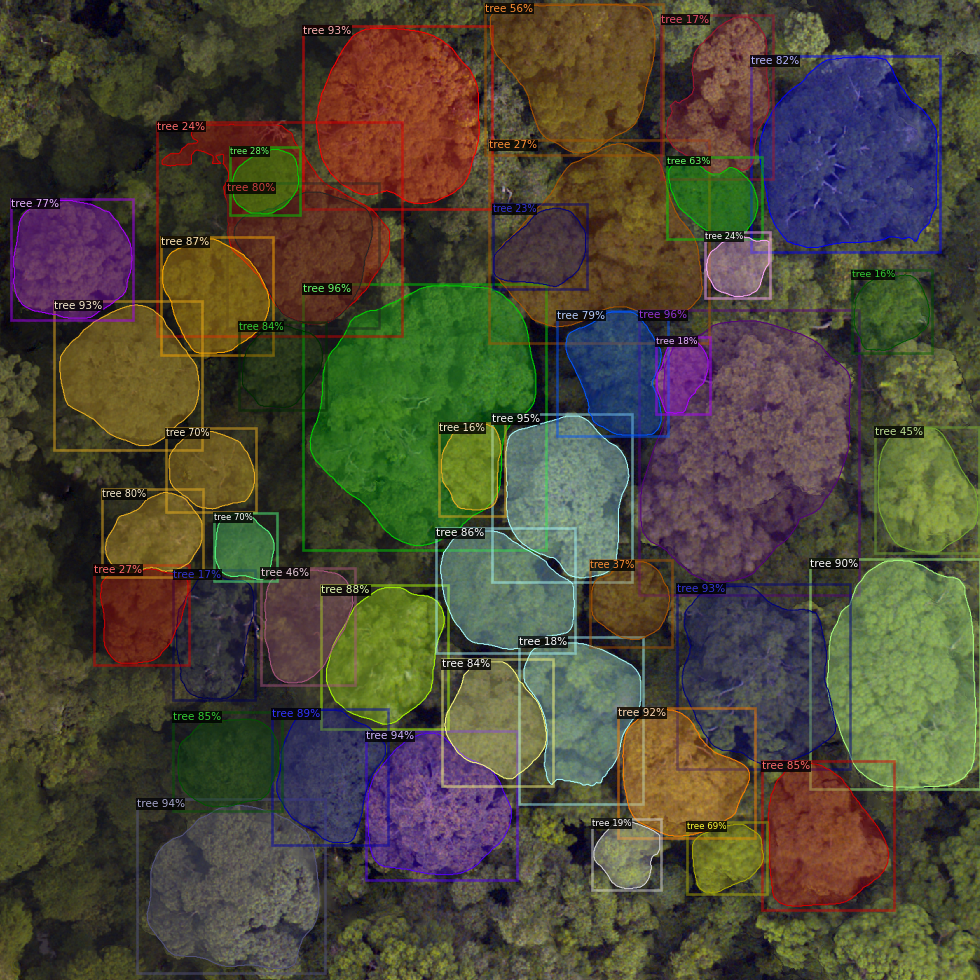

In [ ]:
# Let's look at our predictions on our test dataset!

dataset_dicts = get_tree_dicts("/content/drive/Shareddrives/detectreeRGB/final_train_test_data/test")
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    outputs = predictor(img)
    v = Visualizer(img[:, :, ::-1], metadata=trees_metadata, scale=0.7, instance_mode=ColorMode.IMAGE_BW)   # remove the colors of unsegmented pixels
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    image = cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB)
    display(Image.fromarray(image))